# Example Usage

## Import relevant libraries

In [37]:
from PIL import Image
import numpy as np

## Import ImageAugment

In [38]:
from ImageAugment import basic

## Open Image with PIL

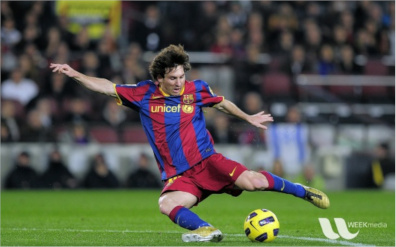

In [220]:
original = Image.open("./example_images/messi5_small.jpg")
original

## Transform Image and Display

### Basic Usage

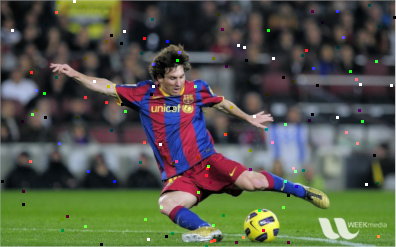

In [234]:
img1 = basic()(original)
img1

#### Function for displaying examples

In [235]:
def plots(original_image, rotate_p=1,flip_p=1,cutout_p=0,add_noise_p=0,rows=8,cols=2,compose=None):
    images = []
    for y in range(cols):
        for x in range(rows):
            if compose == None:
                new_image = basic(rotate_p=rotate_p,flip_p=flip_p,cutout_p=cutout_p,add_noise_p=add_noise_p)(original_image)
            else:
                new_image = compose(original_image)
                
            new_image = np.array(new_image)
            ht, wd, cc= new_image.shape

            ww = int(wd*1.02)
            hh = int(ht*1.02)

            border = np.ones((hh,ww,cc)).astype(np.uint8)*255
            xx = (ww - wd) // 2
            yy = (hh - ht) // 2
            border[yy:yy+ht, xx:xx+wd] = new_image
            new_image = border.copy()

            if x ==0:
                img = new_image
            else:
                img = np.vstack([img,new_image])
        images.append(img)
    return Image.fromarray(np.hstack(images))

## Multiple Examples

### Using 100% probability on all (for demonstration - not recommended)

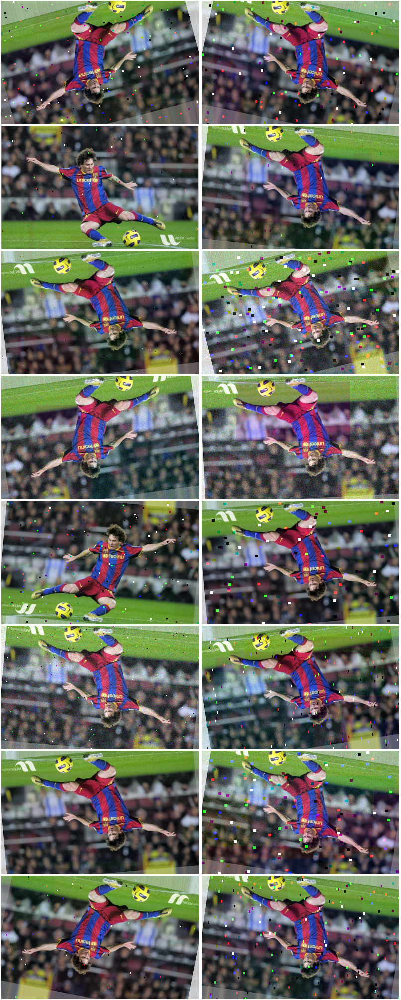

In [236]:
plots(original, rotate_p=1,flip_p=1,cutout_p=1,add_noise_p=1,rows=8,cols=2)

## Change Probability Examples

### Rotate

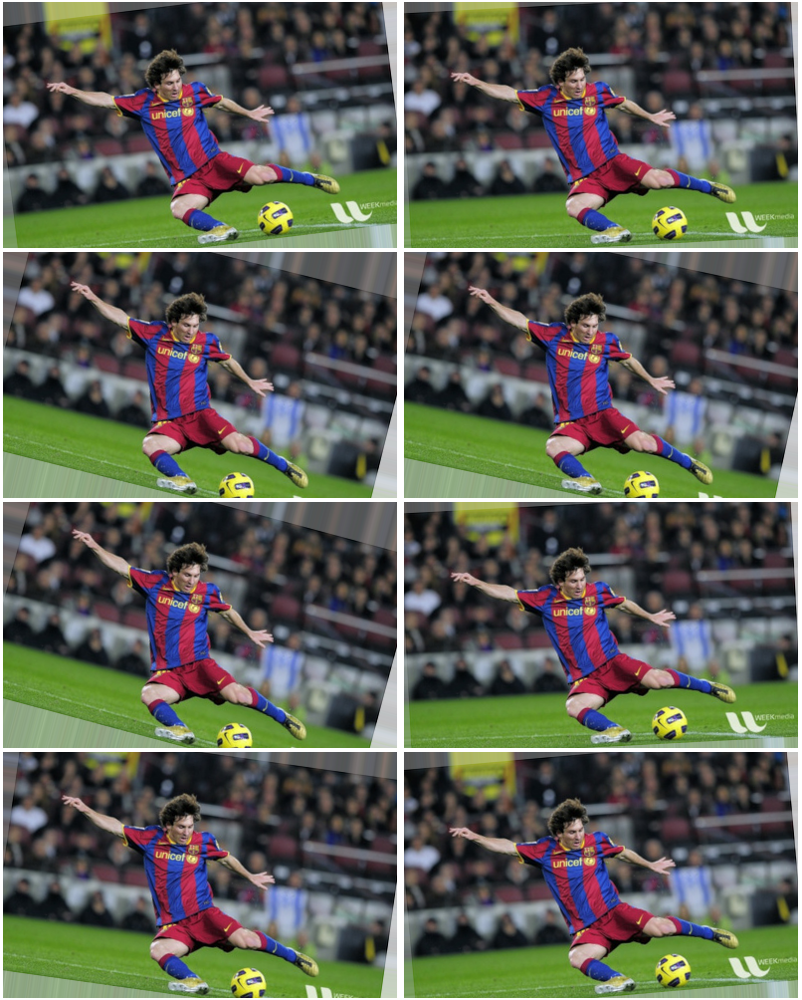

In [237]:
plots(original, rotate_p=1,flip_p=0,cutout_p=0,add_noise_p=0,rows=4,cols=2)

### Flip

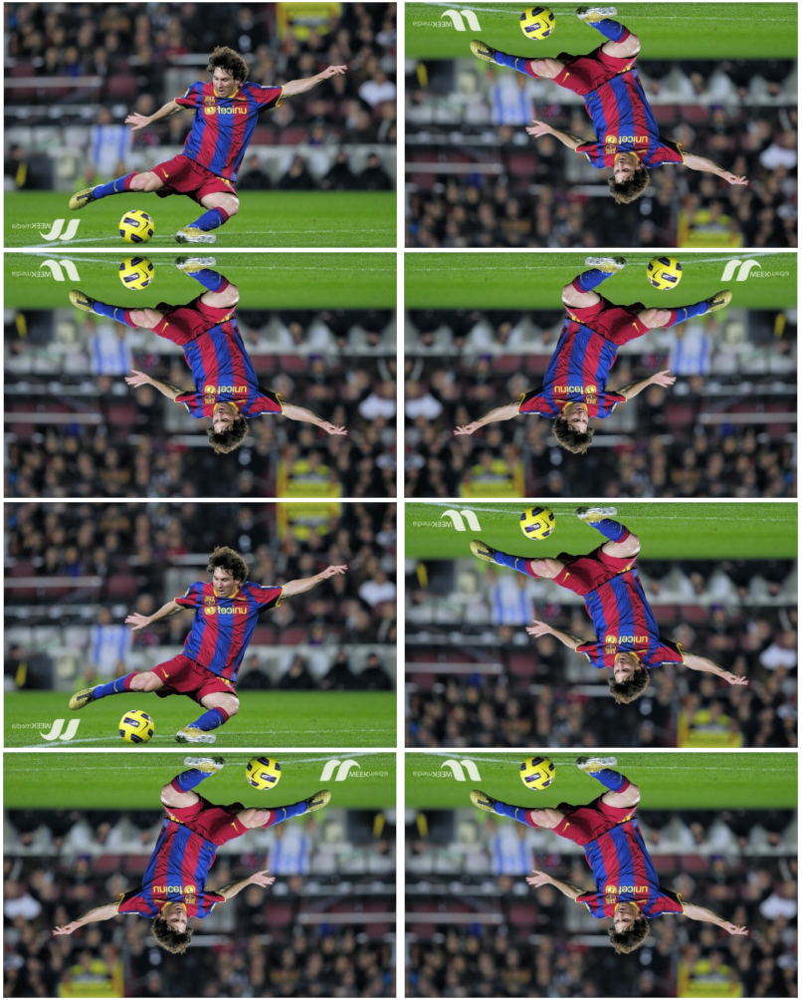

In [238]:
plots(original, rotate_p=0,flip_p=1,cutout_p=0,add_noise_p=0,rows=4,cols=2)


### Cutout

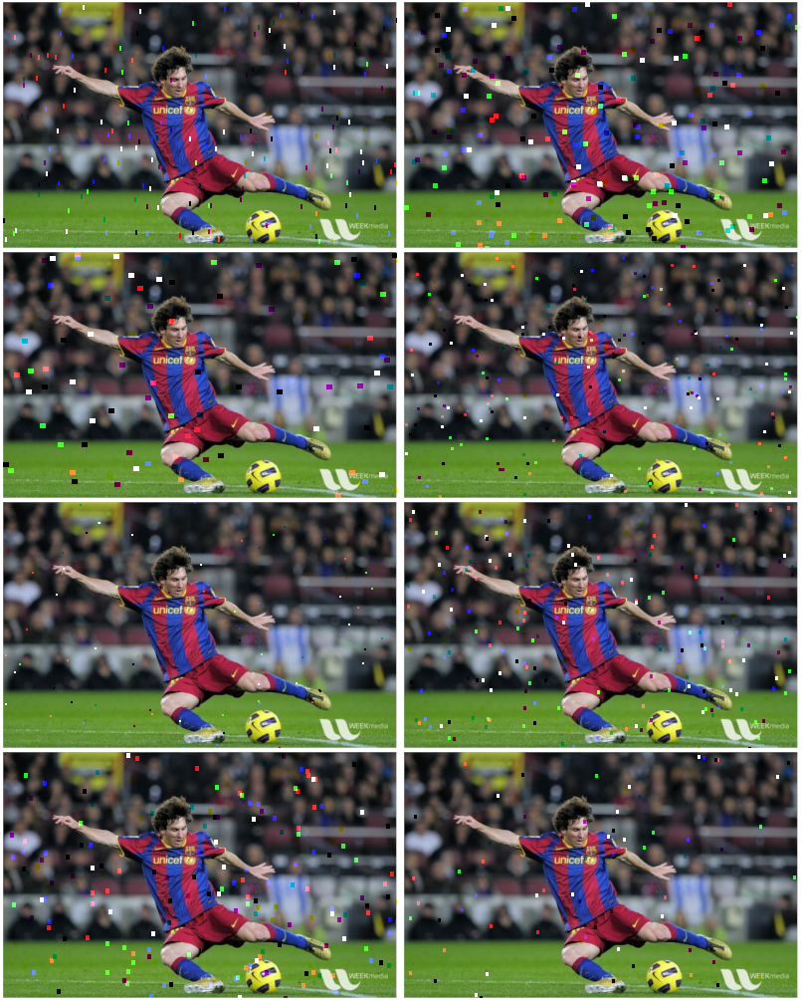

In [239]:
plots(original, rotate_p=0,flip_p=0,cutout_p=1,add_noise_p=0,rows=4,cols=2)


### Noise

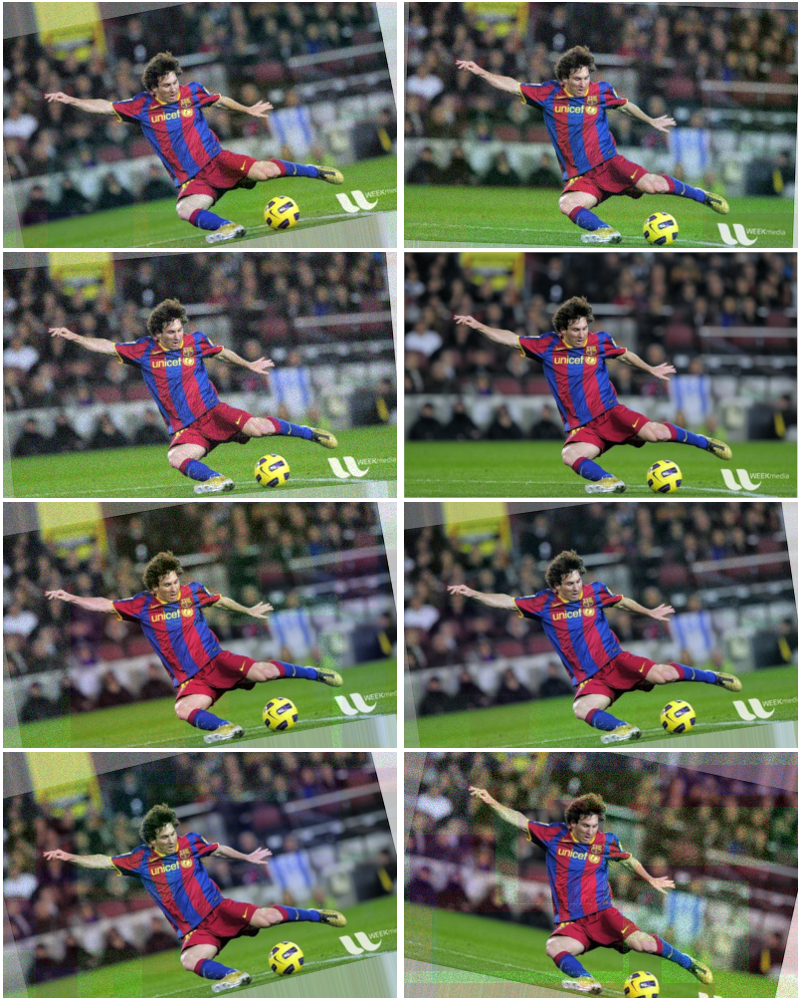

In [240]:
plots(original, rotate_p=1,flip_p=0,cutout_p=0,add_noise_p=1,rows=4,cols=2)


# Pytorch pipeline usage


In [ ]:
from torchvision import transforms as T

In [ ]:
trans = T.Compose([basic(), 
                   T.RandomResizedCrop((original.size[1],original.size[0]),scale=(0.5,1)),
                   T.ColorJitter((0.6,1.4),(0.6,1.4),(0.6,1.4),(-.1,.1))])
trans_tensor = T.Compose([basic(), 
                   T.RandomResizedCrop((original.size[1],original.size[0]),scale=(0.5,1)),
                   T.ColorJitter(),
                   T.ToTensor()])

## Single Image

In [ ]:
trans(original)

## To Tensor

In [ ]:
trans_tensor(original)

## Multiple Variations

In [ ]:
plots(original, rotate_p=1,flip_p=0,cutout_p=0,add_noise_p=1,rows=8,cols=2,compose=trans)

In [241]:
from torchvision import transforms as T

In [242]:
trans = T.Compose([basic(), 
                   T.RandomResizedCrop((original.size[1],original.size[0]),scale=(0.5,1)),
                   T.ColorJitter((0.6,1.4),(0.6,1.4),(0.6,1.4),(-.1,.1))])
trans_tensor = T.Compose([basic(), 
                   T.RandomResizedCrop((original.size[1],original.size[0]),scale=(0.5,1)),
                   T.ColorJitter(),
                   T.ToTensor()])

## Single Image

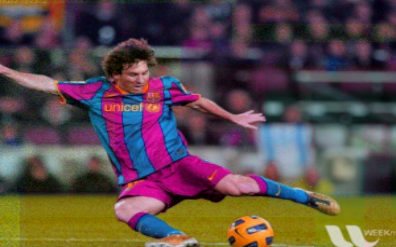

In [243]:
trans(original)

## To Tensor

In [244]:
trans_tensor(original)

tensor([[[0.5373, 0.5294, 0.4980,  ..., 0.2353, 0.2235, 0.2235],
         [0.4588, 0.4706, 0.4745,  ..., 0.2941, 0.3216, 0.3255],
         [0.4431, 0.4549, 0.4588,  ..., 0.3176, 0.3333, 0.3294],
         ...,
         [0.4078, 0.4000, 0.3882,  ..., 0.7843, 0.7843, 0.7843],
         [0.3765, 0.3725, 0.3686,  ..., 0.7843, 0.7843, 0.7843],
         [0.3333, 0.3451, 0.3529,  ..., 0.7804, 0.7804, 0.7804]],

        [[0.6196, 0.5216, 0.4431,  ..., 0.1882, 0.2000, 0.2078],
         [0.5412, 0.5333, 0.5098,  ..., 0.1922, 0.2000, 0.2118],
         [0.4745, 0.5059, 0.5294,  ..., 0.1882, 0.2000, 0.2118],
         ...,
         [0.5882, 0.5765, 0.5647,  ..., 0.8314, 0.8314, 0.8314],
         [0.5490, 0.5451, 0.5412,  ..., 0.8314, 0.8314, 0.8314],
         [0.4941, 0.5059, 0.5137,  ..., 0.8275, 0.8275, 0.8275]],

        [[0.1961, 0.2863, 0.3490,  ..., 0.3725, 0.4118, 0.4235],
         [0.2941, 0.2902, 0.3098,  ..., 0.2706, 0.2667, 0.2784],
         [0.2549, 0.2706, 0.3098,  ..., 0.2588, 0.2941, 0.

## Multiple Variations

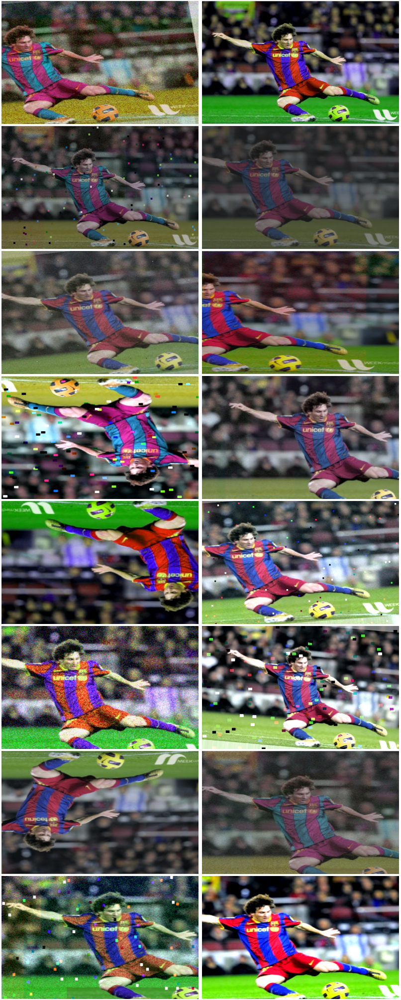

In [245]:
plots(original, rotate_p=1,flip_p=0,cutout_p=0,add_noise_p=1,rows=8,cols=2,compose=trans)